# Описание проекта

Вас пригласили на стажировку в отдел маркетинговой аналитики Яндекс.Афиши. Первое задание: помочь маркетологам снизить расходы — отказаться от невыгодных источников трафика и перераспределить бюджет.
Есть данные Яндекс.Афиши с июня 2017 по конец мая 2018 года:
* лог сервера с данными о посещениях сайта Яндекс.Афиши,
* выгрузка всех заказов за этот период,
* статистика рекламных расходов.

Вам предстоит изучить:
* как клиенты пользуются сервисом,
* когда делают первые покупки на сайте,
* сколько денег приносит компании каждый клиент,
* когда расходы на привлечение клиента окупаются.

Выручка измеряется в условных единицах — у.е.

## Загрузка и подготовка данных к анализу

Для начала подключим библиотеки, которые мы будем использовать в текущем проекте

In [1]:
import pandas as pd #подключение библиотеки pandas для чтения таблиц из файлов и работы табличными типами данных (датафреймами)
pd.set_option('display.float_format', '{:,.2f}'.format) #изменение формата вывода переменных типа float для функций из библиотеки pandas
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>")) #делаем блокнот широкоформатным
import plotly.express as px #библиотека для построения интерактивных графиков
import numpy as np #для функции np.timedelta()
import seaborn as sns #библиотека для отрисовки статистических графиков
from matplotlib import pyplot as plt #библиотека для отрисовки графиков
import math

### Загрузка данных

Прочитаем предоставленные файлы и запишем полученные данные в соответствующие таблицы

In [2]:
visits = pd.read_csv('C:/DA/projects_new/data/visits_log.csv')
orders = pd.read_csv('C:\DA\projects_new\data\orders_log.csv')
costs = pd.read_csv('C:\DA\projects_new\data\costs.csv')

Выведем на экран первые пять строк из каждой таблицы, а также информацию о них

In [3]:
for table in [visits, orders, costs]:
    display(table.head())
    print(table.info())

,Device,End Ts,Source Id,Start Ts,Uid
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   Device     359400 non-null  object
 1   End Ts     359400 non-null  object
 2   Source Id  359400 non-null  int64 
 3   Start Ts   359400 non-null  object
 4   Uid        359400 non-null  uint64
dtypes: int64(1), object(3), uint64(1)
memory usage: 13.7+ MB
None


,Buy Ts,Revenue,Uid
0,2017-06-01 00:10:00,17.00,10329302124590727494
1,2017-06-01 00:25:00,0.55,11627257723692907447
2,2017-06-01 00:27:00,0.37,17903680561304213844
3,2017-06-01 00:29:00,0.55,16109239769442553005
4,2017-06-01 07:58:00,0.37,14200605875248379450


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Buy Ts   50415 non-null  object 
 1   Revenue  50415 non-null  float64
 2   Uid      50415 non-null  uint64 
dtypes: float64(1), object(1), uint64(1)
memory usage: 1.2+ MB
None


,source_id,dt,costs
0,1,2017-06-01,75.20
1,1,2017-06-02,62.25
2,1,2017-06-03,36.53
3,1,2017-06-04,55.00
4,1,2017-06-05,57.08


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2542 entries, 0 to 2541
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   source_id  2542 non-null   int64  
 1   dt         2542 non-null   object 
 2   costs      2542 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 59.7+ KB
None


Рассмотрим описание показателей по выручке и затратам

In [4]:
orders['Revenue'].describe()

count   50,415.00
mean         5.00
std         21.82
min          0.00
25%          1.22
50%          2.50
75%          4.89
max      2,633.28
Name: Revenue, dtype: float64

In [5]:
costs['costs'].describe()

count   2,542.00
mean      129.48
std       156.30
min         0.54
25%        21.95
50%        77.30
75%       170.06
max     1,788.28
Name: costs, dtype: float64

Посчитаем разность между средней суммой по заказам и средней суммой по затратам

In [6]:
50415 * 2.5 - 2542 * 77.3

-70459.1

На первый взгялд кажется, что все не очень хорошо: работаем в минус. Но для более точного понимания картины происходящего нужно проводить более глубокий анализ

### Предобработка данных

Приведем во всех таблицах названия столбцов к строчному формату и уберем лишние пробелы

In [7]:
for table in [visits, orders, costs]:
    table.columns = table.columns.str.lower().str.replace(' ', '_')
    print(table.columns)

Index(['device', 'end_ts', 'source_id', 'start_ts', 'uid'], dtype='object')
Index(['buy_ts', 'revenue', 'uid'], dtype='object')
Index(['source_id', 'dt', 'costs'], dtype='object')


Теперь всем датам присвоим тип данных *datetime64*

In [8]:
visits['end_ts'] = visits['end_ts'].astype('datetime64')
visits['start_ts'] = visits['start_ts'].astype('datetime64')
orders['buy_ts'] = orders['buy_ts'].astype('datetime64')
costs['dt'] = costs['dt'].astype('datetime64')

Проверим данные на наличие дубликатов

Дубликаты в таблицах не обнаружены

Рассмотрим, с каких устройств и благодаря каким источникам привлечения пользователи заходят на страницу

In [9]:
visits['device'].value_counts()

desktop    262567
touch       96833
Name: device, dtype: int64

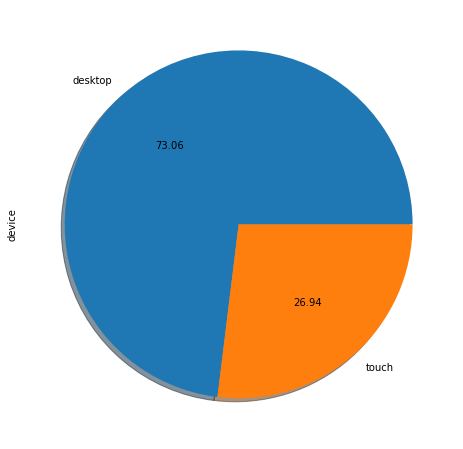

In [10]:
visits.groupby('device')['device'].count().plot(kind='pie', autopct='%.2f', figsize=(10,8), shadow=True)
plt.show()

In [11]:
visits['source_id'].value_counts()

4     101794
3      85610
5      66905
2      47626
1      34121
9      13277
10     10025
7         36
6          6
Name: source_id, dtype: int64

In [12]:
fig = px.histogram(
    visits, x='source_id', color='source_id',
    title='Распределение количества визитов по источникам привлечения'
)
fig.update_layout(yaxis_title = 'Количество визитов',
                  xaxis_title = 'Источники привлечения',
                  title = {'font':dict(size=22),
                           'x':0.5},
                  showlegend=False)
fig.update_traces(hovertemplate = 'Количество визитов: %{x}<br>Источник привлечения: %{y}')
fig.show()

В основном, заходят с компьютера и благодаря источнику привлечения под номером 4 (чтобы это не было)

Напоследок, давайте посмотрим, сходятся ли периоды времени во всех трех таблицах

In [13]:
print('{}\n\n{}\n\n{}\n\n{}'.format
      (
          visits['start_ts'].describe()[['first', 'last']],
          visits['end_ts'].describe()[['first', 'last']],
          orders['buy_ts'].describe()[['first','last']],
          costs['dt'].describe()[['first','last']]
      )
     )

first    2017-06-01 00:01:00
last     2018-05-31 23:59:00
Name: start_ts, dtype: object

first    2017-06-01 00:02:00
last     2018-06-01 01:26:00
Name: end_ts, dtype: object

first    2017-06-01 00:10:00
last     2018-06-01 00:02:00
Name: buy_ts, dtype: object

first    2017-06-01 00:00:00
last     2018-05-31 00:00:00
Name: dt, dtype: object


<ipython-input-13-83243f1abfff>:3: FutureWarning:

Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.

<ipython-input-13-83243f1abfff>:4: FutureWarning:

Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.

<ipython-input-13-83243f1abfff>:5: FutureWarning:

Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.

<ipython-input-13-83243f1abfff>:6: FutureWarning:

Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will b

Периоды сходятся

**Вывод:** мы загрузили и предобработали данные, а также сделали первичный анализ некоторых показателей

## Расчет метрик и построение графиков

### Продуктовые метрики

Найдем основные продуктовые метрики, построим графики их изменений и сделаем выводы из полученных результатов

#### DAU, WAU, MAU

**DAU, WAU и MAU** - это метрики, позволяющие увидеть среднее количество посетителей сайта за день, неделю и месяц, соответственно.

Для того, чтобы их рассчитать в таблице *visits* создадим новые столбцы, в которых поместим информацию о дате (без времени), номере недели, месяце и годе начала пользовательской сессии

In [14]:
visits['start_ts_date'] = visits['start_ts'].dt.date
visits['start_ts_week'] = visits['start_ts'].astype('datetime64[W]')
visits['start_ts_month'] = visits['start_ts'].astype('datetime64[M]')
visits['start_ts_year'] = visits['start_ts'].dt.year

display(visits.head())

,device,end_ts,source_id,start_ts,uid,start_ts_date,start_ts_week,start_ts_month,start_ts_year
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017-12-20,2017-12-14,2017-12-01,2017
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018-02-19,2018-02-15,2018-02-01,2018
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017-07-01,2017-06-29,2017-07-01,2017
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-05-20,2018-05-17,2018-05-01,2018
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017-12-27,2017-12-21,2017-12-01,2017


Сгруппируем посещения по каждому из временных промежутков и найдем число уникальных пользователей, зашедших на сайт Яндекс.Афиши

In [15]:
dau_visits = visits.groupby('start_ts_date').agg({'uid':'nunique'}).reset_index()
dau_visits.columns = ['date', 'unique_uid']
dau_visits['unique_uid'].mean()

907.9917582417582

In [16]:
dau_visits = visits.groupby(['start_ts_year', 'start_ts_date']).agg({'uid':'nunique'}).reset_index()
dau_visits.columns = ['year', 'date', 'unique_uid']
wau_visits = visits.groupby(['start_ts_year', 'start_ts_week']).agg({'uid':'nunique'}).reset_index()
wau_visits.columns = ['year', 'week', 'unique_uid']
mau_visits = visits.groupby(['start_ts_year', 'start_ts_month']).agg({'uid':'nunique'}).reset_index()
mau_visits.columns = ['year', 'month', 'unique_uid']

dau_visits_mean = dau_visits['unique_uid'].mean()
wau_visits_mean = wau_visits['unique_uid'].mean()
mau_visits_mean = mau_visits['unique_uid'].mean()

print('Среднее количество посещений за день: {}\nСреднее количество посещений за неделю: {}\nСреднее количество посещений за месяц: {}'
      .format(int(dau_visits_mean), int(wau_visits_mean), int(mau_visits_mean)))

Среднее количество посещений за день: 907
Среднее количество посещений за неделю: 5621
Среднее количество посещений за месяц: 23228


Отлично, теперь мы знаем среднее количество уникальных пользователей в день, неделю и месяц. Для полноты картины найдем еще **sticky factor** - показатель регулярности посещений в разрезе недели и месяца

In [17]:
sticky_wau = dau_visits_mean / wau_visits_mean
sticky_mau = dau_visits_mean / mau_visits_mean

print('Sticky factor для недели: {:.0%}\nSticky factor для месяца: {:.0%}'
      .format(sticky_wau, sticky_mau))


Sticky factor для недели: 16%
Sticky factor для месяца: 4%


Недельная регулярность еще неплохая - 16%, а вот месячная - всего 4 посетителя из 100... Или не всего? Для того, чтобы ответить на этот вопрос, посмотрим на значения *DAU, WAU и MAU* не в абсолюте, а на их изменения с течением времени

In [18]:
fig = px.line(
    dau_visits, x='date', y='unique_uid', color='year',
    title='Среднее количество уникальных пользователей в день'
)
fig.update_layout(yaxis_title = 'Количество пользователей в день',
                  xaxis_title = '',
                  title = {'font':dict(size=22),
                           'x':0.5},
                  showlegend=True)

fig.update_traces(hovertemplate = 'Дата: %{x}<br>Количество пользователей: %{y}')
fig.show()

На графике видно три точки, которые выделяются на фоне остальных: 24-11-2017 (3319 посетителей), 30-01-2018 (1), 31-05-2018 (1997). Нужно узнать у коллег, с чем могут быть связаны данные отклонения. В остальном же видно, что среднее количество посещений выросло в октябре 2017-го и упало после сбоя 31-го марта 2018-го. Может это сезонность, а может повлиял сам сбой, после которого ресурс потерял часть пользователей

In [19]:
fig = px.bar(
    wau_visits, x='week', y='unique_uid', color='year', 
    title='Среднее количество уникальных пользователей в неделю'
)
fig.update_layout(yaxis_title = 'Количество пользователей за неделю',
                  xaxis_title = 'Дата',
                  title = {'font':dict(size=22),
                           'x':0.5},
                  showlegend=False)

fig.update_traces(hovertemplate = 'Дата начала недели: %{x}<br>Количество пользователей: %{y}')
fig.show()

In [20]:
fig = px.bar(mau_visits, x='month', y='unique_uid', color='year',
    title='Среднее количество уникальных пользователей за месяц'
)
fig.update_layout(yaxis_title = 'Количество пользователей за месяц',
                  xaxis_title = 'Дата',
                  title = {'font':dict(size=22),
                           'x':0.5},
                  showlegend=False)

fig.update_traces(hovertemplate = 'Дата начала месяца: %{x}<br>Количество пользователей: %{y}')
fig.show()

По этим графикам можно сказать, что посещение сервиса Афиши носит сезонный характер или, если можно так сказать, квартальный: в первом и четвертом кварталах среднее количество уникальных пользователей в месяц почти в два раза больше, чем во втором и третьем

In [21]:
print('Среднее количество посещений во II-й и III-й кварталы:', round(mau_visits.query('month >= "2018-04-01" | month <= "2017-09-01"')['unique_uid'].mean()))
print('Среднее количество посещений за I-й и IV-й кварталы:', round(mau_visits.query('"2017-10-01" <= month <= "2018-03-01"')['unique_uid'].mean()))

Среднее количество посещений во II-й и III-й кварталы: 16626
Среднее количество посещений за I-й и IV-й кварталы: 29831


Возможно, это связано с тем, что ближе к концу года людям все более интересны афиши новогодних мероприятий, в январе новогодние праздники продолжаются, а в феврале и в марте - день защитника Отечества и международный женский день, соответственно. С апреля по сентябрь, в основном, люди в работе и отпусках, им не до культурных мероприятий

#### Среднее количество посещений в день

Теперь найдем среднее количество посещений для одного пользователя за один день

In [22]:
visits_count_by_date_and_uid = visits.groupby(['start_ts_date', 'uid']).agg({'start_ts':'count'}).reset_index()
visits_count_by_date_and_uid.columns = ['date', 'uid', 'session_counts']
visits_mean_by_date = visits_count_by_date_and_uid.groupby('date').agg({'session_counts':'mean'}).reset_index()
visits_mean_by_date.columns = ['date', 'session_mean']
print('Среднее количество посещений по дням:\n', visits_mean_by_date.head())

Среднее количество посещений по дням:
          date  session_mean
0  2017-06-01          1.10
1  2017-06-02          1.08
2  2017-06-03          1.07
3  2017-06-04          1.07
4  2017-06-05          1.09


Отобразим на графике, как этот показатель менялся с течением времени

In [23]:
fig = px.line(
    visits_mean_by_date, x='date', y='session_mean',
    title='Среднее количество сессий для одного пользователя в день'
)
fig.update_layout(yaxis_title = 'Среднее количество сессий в день',
                  xaxis_title = '',
                  title = {'font':dict(size=22),
                           'x':0.5},
                  showlegend=False)

fig.update_traces(hovertemplate = 'Дата: %{x}<br>Среднее количество сессий: %{y}')
fig.show()

Среднее количество посещений в день для одного пользователя чуть подросло: примерно с 1.075 до 1.1. Опять-таки видим вспышку 24-11-2017 (1.21 посещение у одного пользователя в среднем) и провал 31-03-2018 (1 посещение)

#### Средняя продолжительность сессии

Прежде чем мы будем искать продолжительность сессии, проверим, корректны ли наши данные: всегда ли значение конца сессии позже, чем значения ее начала

In [24]:
visits[visits['start_ts'] > visits['end_ts']].head()

,device,end_ts,source_id,start_ts,uid,start_ts_date,start_ts_week,start_ts_month,start_ts_year
4181,desktop,2018-03-25 03:18:00,3,2018-03-25 03:50:00,13092152539246794986,2018-03-25,2018-03-22,2018-03-01,2018
177972,desktop,2018-03-25 03:09:00,9,2018-03-25 03:55:00,4621202742905035453,2018-03-25,2018-03-22,2018-03-01,2018


Поменяем местами в таких строчках значения начала и конца сессии

In [25]:
for index in visits[visits['start_ts'] > visits['end_ts']].index:
    temp = visits['start_ts'][index]
    visits.at[index, 'start_ts'] = visits['end_ts'][index]
    visits.at[index, 'end_ts'] = temp

In [26]:
print(visits.loc[4181, ['start_ts', 'end_ts']])
print(visits.loc[177972, ['start_ts', 'end_ts']])

start_ts    2018-03-25 03:18:00
end_ts      2018-03-25 03:50:00
Name: 4181, dtype: object
start_ts    2018-03-25 03:09:00
end_ts      2018-03-25 03:55:00
Name: 177972, dtype: object


Замена произведена успешно. Теперь создадим столбец с продолжительностью одной сессии

In [27]:
visits['session_duration_sec'] = (visits['end_ts'] - visits['start_ts']).dt.seconds
visits['session_duration_sec'].describe()

count   359,400.00
mean        643.05
std         997.11
min           0.00
25%         120.00
50%         300.00
75%         840.00
max      42,660.00
Name: session_duration_sec, dtype: float64

По полученному описанию можно сказать, что продолжительность сессии изменяется от 0 до 84480 секунд (почти целые сутки), но большая часть значений лежит в пределах до 840 секунд. Среднее значение продолжительности равно 643,5 секунды, что сильно отличается от медианы (300 секунд) из-за того, что в выборке присутствуют очень длинные сессии.

Построим график распределения продолжительности сессии на отрезке от 0 до 1000 секунд

In [28]:
fig = px.histogram(
    visits.query('session_duration_sec <= 1000'), x='session_duration_sec', nbins=20,
    title='Распределение по продолжительности сессий (в секундах)'
)
fig.update_layout(yaxis_title = 'Количество сессий',
                  xaxis_title = 'Продолжительность сессии (в секундах)',
                  title = {'font':dict(size=22),
                           'x':0.5},
                  showlegend=False)
fig.update_traces(hovertemplate = 'Продолжительность сессии (с): %{x}<br>Количество сессий: %{y}')
fig.show()

Пропуски на некоторых интервалах выглядят достаточно странно. Это может говорить нам либо о том, что наши данные повреждены, либо о том, что все приходящие даты округляются до минут.

Приведем длительность сессии к минутам и посмотрим на то, что получится

In [29]:
visits['session_duration_min'] = (visits['session_duration_sec'] / 60 ).astype('int')
visits['session_duration_min'].describe()

count   359,400.00
mean         10.72
std          16.62
min           0.00
25%           2.00
50%           5.00
75%          14.00
max         711.00
Name: session_duration_min, dtype: float64

Отобразим на графике распределение от 0 до 15 минут

In [30]:
fig = px.histogram(
    visits.query('session_duration_min <= 15'), x='session_duration_min',
    title='Распределение по продолжительности сессий (в минутах)'
)
fig.update_layout(yaxis_title = 'Количество сессий',
                  xaxis_title = 'Продолжительность сессии (в минутах)',
                  title = {'font':dict(size=22),
                           'x':0.5},
                  showlegend=False)
fig.update_traces(hovertemplate = 'Продолжительность сессии (мин): %{x}<br>Количество сессий: %{y}')
fig.show()

Совсем другое дело: гистограмма без разрывов и приятная на глаз - красота! Больше всего коротких сессий (от 0 до 3 минут) и с увеличением продолжительности сессии количество сессий уменьшается. Самое частое значение - от 1 до 2 минут - это видно и на графике, но на всякий случай сверимся:

In [31]:
print(visits['session_duration_min'].mode())

0    1
dtype: int32


Так и есть. Мода равна 1 минуте - это сильно отличается от среднего значения, которое мы нашли ранее. Плохой это результат или нет? Если пользователь успевает за 60 секунд купить билет, то хорошо, если нет - то плохо, и надо разбираться в причинах столь короткого визита

#### Retention rate по когортам

**Retention rate** - это коэффициент удержания пользователя. Он показывает, какой процент людей повторно вернулся на сервис афиши после первого посещения сайта. Для того, чтобы рассчитать данный показатель, применим метод когортного анализа - разобьем пользователей на когорты по дате их первого посещения нашего сервиса, - а затем посчитаем *retention rate* для каждой когорты.

Для начала найдем для каждого пользователя дату его первого визита

In [32]:
first_sessions = visits.groupby('uid')['start_ts'].min()
first_sessions.name = 'first_ts'
user_activity = visits.join(first_sessions, on='uid')
display(user_activity.head())

,device,end_ts,source_id,start_ts,uid,start_ts_date,start_ts_week,start_ts_month,start_ts_year,session_duration_sec,session_duration_min,first_ts
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017-12-20,2017-12-14,2017-12-01,2017,1080,18,2017-12-20 17:20:00
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018-02-19,2018-02-15,2018-02-01,2018,1680,28,2018-02-19 16:53:00
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017-07-01,2017-06-29,2017-07-01,2017,0,0,2017-07-01 01:54:00
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-05-20,2018-05-17,2018-05-01,2018,1440,24,2018-03-09 20:05:00
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017-12-27,2017-12-21,2017-12-01,2017,0,0,2017-12-27 14:06:00


Приведем значения даты первого визита к формату даты первого числа текущего месяца. То же самое проделаем с датой начала текущей сессии пользователя

In [33]:
user_activity['first_activity_month'] = user_activity['first_ts'].astype('datetime64[M]')
user_activity['activity_month'] = user_activity['start_ts'].astype('datetime64[M]')

display(user_activity.head())

,device,end_ts,source_id,start_ts,uid,start_ts_date,start_ts_week,start_ts_month,start_ts_year,session_duration_sec,session_duration_min,first_ts,first_activity_month,activity_month
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017-12-20,2017-12-14,2017-12-01,2017,1080,18,2017-12-20 17:20:00,2017-12-01,2017-12-01
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018-02-19,2018-02-15,2018-02-01,2018,1680,28,2018-02-19 16:53:00,2018-02-01,2018-02-01
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017-07-01,2017-06-29,2017-07-01,2017,0,0,2017-07-01 01:54:00,2017-07-01,2017-07-01
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-05-20,2018-05-17,2018-05-01,2018,1440,24,2018-03-09 20:05:00,2018-03-01,2018-05-01
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017-12-27,2017-12-21,2017-12-01,2017,0,0,2017-12-27 14:06:00,2017-12-01,2017-12-01


Рассчитаем *lifetime* (возраст) - сколько раз сменился месяц к моменту текущей сессии с момента первого визита пользователя

In [34]:
user_activity['lifetime'] = (
    (
        user_activity['activity_month'] - user_activity['first_activity_month']
    ) / np.timedelta64(1, 'M')
).round().astype(int)
display(user_activity.head())

,device,end_ts,source_id,start_ts,uid,start_ts_date,start_ts_week,start_ts_month,start_ts_year,session_duration_sec,session_duration_min,first_ts,first_activity_month,activity_month,lifetime
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017-12-20,2017-12-14,2017-12-01,2017,1080,18,2017-12-20 17:20:00,2017-12-01,2017-12-01,0
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018-02-19,2018-02-15,2018-02-01,2018,1680,28,2018-02-19 16:53:00,2018-02-01,2018-02-01,0
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017-07-01,2017-06-29,2017-07-01,2017,0,0,2017-07-01 01:54:00,2017-07-01,2017-07-01,0
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018-05-20,2018-05-17,2018-05-01,2018,1440,24,2018-03-09 20:05:00,2018-03-01,2018-05-01,2
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017-12-27,2017-12-21,2017-12-01,2017,0,0,2017-12-27 14:06:00,2017-12-01,2017-12-01,0


Найдем количество уникальных пользователей, сгруппированнах по месяцу, в котором они впервые посетили Яндекс.Афишу, и значению *lifetime* для текущего визита

In [35]:
cohorts_of_visitors = user_activity.groupby(['first_activity_month', 'lifetime']).agg({'uid':'nunique'}).reset_index()
display(cohorts_of_visitors)

,first_activity_month,lifetime,uid
0,2017-06-01,0,13259
1,2017-06-01,1,1043
2,2017-06-01,2,713
3,2017-06-01,3,814
4,2017-06-01,4,909
...,...,...,...
73,2018-03-01,1,861
74,2018-03-01,2,557
75,2018-04-01,0,15709
76,2018-04-01,1,760


...и изначальное количество пользователей в каждой когорте

In [36]:
initial_users_count = cohorts_of_visitors[cohorts_of_visitors['lifetime'] == 0][['first_activity_month', 'uid']]
initial_users_count = initial_users_count.rename(columns={'uid':'cohort_users'})
display(initial_users_count.head())

,first_activity_month,cohort_users
0,2017-06-01,13259
12,2017-07-01,13140
23,2017-08-01,10181
33,2017-09-01,16704
42,2017-10-01,25977


И посчитаем искомый *retention rate* для каждой когорты (и каждого ее возраста)

In [37]:
cohorts_of_visitors = cohorts_of_visitors.merge(initial_users_count, on='first_activity_month')
cohorts_of_visitors['retention'] = cohorts_of_visitors['uid'] / cohorts_of_visitors['cohort_users']
display(cohorts_of_visitors.head())

,first_activity_month,lifetime,uid,cohort_users,retention
0,2017-06-01,0,13259,13259,1.00
1,2017-06-01,1,1043,13259,0.08
2,2017-06-01,2,713,13259,0.05
3,2017-06-01,3,814,13259,0.06
4,2017-06-01,4,909,13259,0.07


Представим все в сводной таблице

In [38]:
retention_pivot = cohorts_of_visitors.pivot_table(
    index='first_activity_month',
    columns='lifetime',
    values='retention',
    aggfunc='sum'
)
display(retention_pivot)

lifetime,0,1,2,3,4,5,6,7,8,9,10,11
first_activity_month,,,,,,,,,,,,
2017-06-01,1.00,0.08,0.05,0.06,0.07,0.07,0.06,0.06,0.05,0.05,0.04,0.04
2017-07-01,1.00,0.06,0.05,0.06,0.06,0.05,0.05,0.05,0.04,0.03,0.03,NaN
2017-08-01,1.00,0.08,0.06,0.06,0.05,0.04,0.04,0.04,0.03,0.03,NaN,NaN
2017-09-01,1.00,0.09,0.07,0.05,0.04,0.04,0.04,0.02,0.02,NaN,NaN,NaN
2017-10-01,1.00,0.08,0.05,0.04,0.03,0.03,0.02,0.02,NaN,NaN,NaN,NaN
2017-11-01,1.00,0.08,0.04,0.04,0.03,0.02,0.02,NaN,NaN,NaN,NaN,NaN
2017-12-01,1.00,0.06,0.04,0.03,0.02,0.02,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-01,1.00,0.06,0.04,0.02,0.02,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-02-01,1.00,0.06,0.03,0.02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


И визуализируем данные в виде тепловой карты

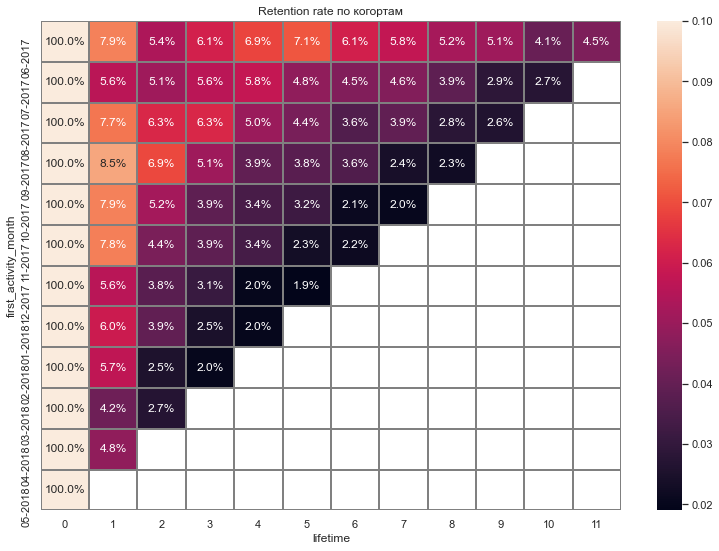

In [39]:
sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('Retention rate по когортам')
sns.heatmap(retention_pivot, annot=True, fmt='.1%', linewidths=1, linecolor='gray',
        yticklabels=retention_pivot.index.strftime('%m-%Y'), vmax=0.1);

Как мы видим, дела с удержанием клиентов обстоят не очень: после первого месяца число вернувшихся в сервис пользователей только единожды составило десятую часть от начального количества посетителей из данной когорты.

Давайте найдем средний коэффициент удержания для второго месяца:

In [40]:
print('Средний retention rate для второго месяца: {:.1%}'.format(cohorts_of_visitors.groupby('lifetime')['retention'].mean()[2]))

Средний retention rate для второго месяца: 4.6%


Всего 4.6%. Этот показатель нужно повышать. Для начала можно было бы проверить, все ли в порядке с интерфейсом, нет ли проблем у пользователей, связанных с переходом из одного состояния в другое. Если с этим все в порядке, то тогда подумать над способом напоминания о сервисе: рассылкой для пользователей со специальным предложением (например, скидкой на какой-нибудь концерт) и т.п.

<div class="alert alert-info"> <b>Комментарий студента:</b> Прикольно! За vmax спасибо! Че-то я сам не додумался(-гуглился) до этого😅 </div>

### Метрики электронной коммерции

В данном разделе рассмотрим среднее время до покупки, среднее количество заказов в месяц, средний чек и средний доход с одного пользователя. Также построим графики и оценим полученные результаты

#### Среднее время до покупки

Чтобы узнать, сколько времени в среднем проходит до момента первой покупки, необходимо узнать время первого визита и время первой покупки

In [41]:
first_visits = visits.groupby('uid').agg({'start_ts':'min'}).reset_index()
first_purchases = orders.groupby('uid').agg({'buy_ts':'min'}).reset_index()
display(first_visits.head())
display(first_purchases.head())

,uid,start_ts
0,11863502262781,2018-03-01 17:27:00
1,49537067089222,2018-02-06 15:55:00
2,297729379853735,2017-06-07 18:47:00
3,313578113262317,2017-09-18 22:49:00
4,325320750514679,2017-09-30 14:29:00


,uid,buy_ts
0,313578113262317,2018-01-03 21:51:00
1,1575281904278712,2017-06-03 10:13:00
2,2429014661409475,2017-10-11 18:33:00
3,2464366381792757,2018-01-28 15:54:00
4,2551852515556206,2017-11-24 10:14:00


Теперь у нас есть две таблицы с датами первых сессий и первых покупок для каждого посетителя. Объединим их по уникальному идентификатору пользователя

In [42]:
buyers = first_visits.merge(first_purchases, on='uid')
buyers.head()

,uid,start_ts,buy_ts
0,313578113262317,2017-09-18 22:49:00,2018-01-03 21:51:00
1,1575281904278712,2017-06-03 10:13:00,2017-06-03 10:13:00
2,2429014661409475,2017-10-11 17:14:00,2017-10-11 18:33:00
3,2464366381792757,2018-01-27 20:10:00,2018-01-28 15:54:00
4,2551852515556206,2017-11-24 10:14:00,2017-11-24 10:14:00


Найдем разницу между датой покупки и датой первого визита. Приведем ее сразу к минутам

In [43]:
buyers['time_before_purchase_min'] = ((buyers['buy_ts'] - buyers['start_ts']).dt.seconds / 60).astype('int')
buyers.head()

,uid,start_ts,buy_ts,time_before_purchase_min
0,313578113262317,2017-09-18 22:49:00,2018-01-03 21:51:00,1382
1,1575281904278712,2017-06-03 10:13:00,2017-06-03 10:13:00,0
2,2429014661409475,2017-10-11 17:14:00,2017-10-11 18:33:00,79
3,2464366381792757,2018-01-27 20:10:00,2018-01-28 15:54:00,1184
4,2551852515556206,2017-11-24 10:14:00,2017-11-24 10:14:00,0


Рассмотрим характеристики распределения времени до покупки

In [44]:
print(buyers['time_before_purchase_min'].describe())

count   36,523.00
mean       249.16
std        429.74
min          0.00
25%          4.00
50%         16.00
75%        252.00
max      1,439.00
Name: time_before_purchase_min, dtype: float64


Как мы видим, снова самые высокие значения завышают среднее, которое превышает 4 часа. Так как мы рассматриваем не одну непрерывную сессию, в ходе которой был приобретен билет, а все время, которое прошло от момента первого посещения до покупки, такой вариант возможен, однако медианное значение в 16 минут говорит о том, что все-таки это не целевое значение.

Отобразим графически данное распределение и найдем самое часто встречающееся значение

In [45]:
fig = px.histogram(
    buyers.query('time_before_purchase_min <= 40'), x='time_before_purchase_min',
    title='Распределение времени с момента первого визита до момента первой покупки (в минутах)'
)
fig.update_layout(
    yaxis_title = 'Количество покупок',
    xaxis_title = 'Время (в минутах)',
    title = {'font':dict(size=22),
             'x':0.5},
    showlegend=False
)
fig.update_traces(hovertemplate = 'Время (мин): %{x}<br>Количество покупок: %{y}')
fig.show()

Как мы видим картина похожая на распределение продолжительности сессии, хоть здесь гистограмма более размазанная по оси X (время), но все равно большинство пользователей совершает первую покупку в течение первых 16-ти минут, а самое частое значение - все та же одна минута

In [46]:
buyers['time_before_purchase_min'].mode()

0    1
dtype: int32

#### Среднее количество покупок в месяц

Найдем среднее количество покупок в месяц для одного пользователя. Применим метод когортного анализа, то есть разобьем пользователей на когорты, характеристики которых и будем исследовать

In [47]:
orders.head()

,buy_ts,revenue,uid
0,2017-06-01 00:10:00,17.00,10329302124590727494
1,2017-06-01 00:25:00,0.55,11627257723692907447
2,2017-06-01 00:27:00,0.37,17903680561304213844
3,2017-06-01 00:29:00,0.55,16109239769442553005
4,2017-06-01 07:58:00,0.37,14200605875248379450


In [48]:
orders['buy_month[M]'] = orders['buy_ts'].astype('datetime64[M]')
orders.head()

,buy_ts,revenue,uid,buy_month[M]
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01


Найдем месяц первого заказа для каждого пользователя

In [49]:
first_orders = orders.groupby('uid')['buy_month[M]'].min().reset_index()
first_orders.columns = ['uid', 'first_buy_month']
first_orders.head()

,uid,first_buy_month
0,313578113262317,2018-01-01
1,1575281904278712,2017-06-01
2,2429014661409475,2017-10-01
3,2464366381792757,2018-01-01
4,2551852515556206,2017-11-01


Определим размер когорт (начальное количество пользователей в каждой когорте)

In [50]:
cohort_sizes = (
    first_orders.groupby('first_buy_month')
    .agg({'uid':'nunique'})
    .reset_index()
)
cohort_sizes.columns = ['first_buy_month', 'n_buyers']
cohort_sizes.head()

,first_buy_month,n_buyers
0,2017-06-01,2023
1,2017-07-01,1923
2,2017-08-01,1370
3,2017-09-01,2581
4,2017-10-01,4340


Объединим таблицы заказов с таблицей первых заказов по *uid*

In [51]:
orders_new = orders.merge(first_orders, on='uid')
orders_new.head()

,buy_ts,revenue,uid,buy_month[M],first_buy_month
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01,2017-06-01


Создадим таблицу покупателей, в которой будет информация о количестве заказов каждой когорты в каждом месяце ее существования

In [52]:
cohorts_of_buyers = (
    orders_new.groupby(['first_buy_month', 'buy_month[M]'])
    .agg({'buy_ts':'count'})
    .reset_index()
).rename(columns={'buy_ts':'n_orders'})
cohorts_of_buyers.head()

,first_buy_month,buy_month[M],n_orders
0,2017-06-01,2017-06-01,2354
1,2017-06-01,2017-07-01,177
2,2017-06-01,2017-08-01,174
3,2017-06-01,2017-09-01,226
4,2017-06-01,2017-10-01,292


Также добавим к этой таблице размер каждой когорты

In [53]:
cohorts_of_buyers = cohort_sizes.merge(cohorts_of_buyers, on='first_buy_month')
cohorts_of_buyers.head()

,first_buy_month,n_buyers,buy_month[M],n_orders
0,2017-06-01,2023,2017-06-01,2354
1,2017-06-01,2023,2017-07-01,177
2,2017-06-01,2023,2017-08-01,174
3,2017-06-01,2023,2017-09-01,226
4,2017-06-01,2023,2017-10-01,292


Посчитаем возраст каждой когорты в каждом месяце

In [54]:
cohorts_of_buyers['age'] = (
    (
        cohorts_of_buyers['buy_month[M]'] - cohorts_of_buyers['first_buy_month']
    ) / np.timedelta64(1, 'M')
).round().astype(int)
cohorts_of_buyers.head()

,first_buy_month,n_buyers,buy_month[M],n_orders,age
0,2017-06-01,2023,2017-06-01,2354,0
1,2017-06-01,2023,2017-07-01,177,1
2,2017-06-01,2023,2017-08-01,174,2
3,2017-06-01,2023,2017-09-01,226,3
4,2017-06-01,2023,2017-10-01,292,4


Рассчитаем среднее количество заказов в месяц для каждой когорты

In [55]:
cohorts_of_buyers['avg_orders'] = cohorts_of_buyers['n_orders'] / cohorts_of_buyers['n_buyers']
cohorts_of_buyers.head()

,first_buy_month,n_buyers,buy_month[M],n_orders,age,avg_orders
0,2017-06-01,2023,2017-06-01,2354,0,1.16
1,2017-06-01,2023,2017-07-01,177,1,0.09
2,2017-06-01,2023,2017-08-01,174,2,0.09
3,2017-06-01,2023,2017-09-01,226,3,0.11
4,2017-06-01,2023,2017-10-01,292,4,0.14


Составим сводную таблицу

In [56]:
orders_per_months_pivot = cohorts_of_buyers.pivot_table(
    index='first_buy_month',
    columns='age',
    values='avg_orders'
)
orders_per_months_pivot.cumsum(axis=1).fillna('')

age,0,1,2,3,4,5,6,7,8,9,10,11
first_buy_month,,,,,,,,,,,,
2017-06-01,1.16,1.25,1.34,1.45,1.59,1.70,1.84,1.92,2.03,2.10,2.15,2.19
2017-07-01,1.14,1.19,1.25,1.31,1.34,1.39,1.42,1.44,1.47,1.49,1.51,
2017-08-01,1.12,1.20,1.27,1.33,1.39,1.44,1.47,1.53,1.56,1.60,,
2017-09-01,1.14,1.22,1.28,1.35,1.37,1.42,1.46,1.48,1.50,,,
2017-10-01,1.14,1.22,1.25,1.28,1.31,1.34,1.35,1.38,,,,
2017-11-01,1.18,1.28,1.32,1.37,1.41,1.42,1.45,,,,,
2017-12-01,1.15,1.21,1.26,1.30,1.32,1.34,,,,,,
2018-01-01,1.12,1.19,1.24,1.25,1.28,,,,,,,
2018-02-01,1.12,1.18,1.21,1.22,,,,,,,,


Визуализируем сводную таблицу в виде тепловой карты

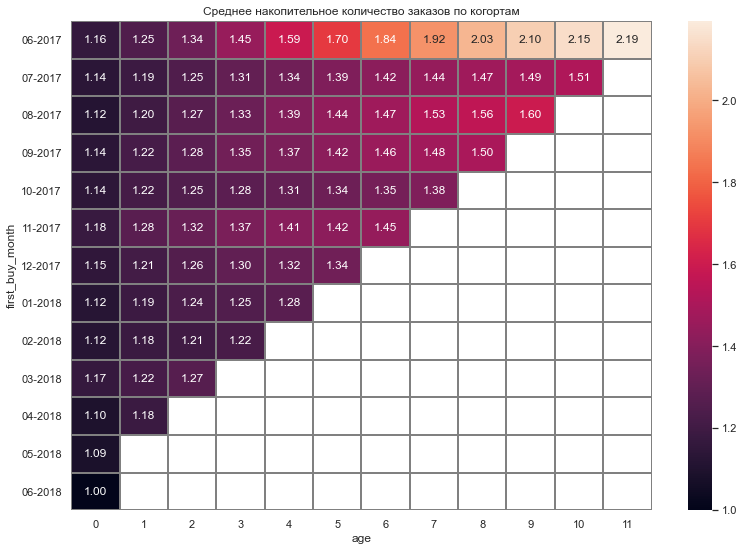

In [57]:
sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('Среднее накопительное количество заказов по когортам')
sns.heatmap(orders_per_months_pivot.cumsum(axis=1), annot=True, fmt='.2f', linewidths=1, linecolor='gray',
        yticklabels=orders_per_months_pivot.index.strftime('%m-%Y'));

In [58]:
print('Среднее количество покупок на одного покупателя через 6 месяцев равно: {:.2f}'.format(orders_per_months_pivot.cumsum(axis=1)[6].mean()))

Среднее количество покупок на одного покупателя через 6 месяцев равно: 1.50


#### Средний чек

Сгруппируем данные о заказах по времени (по дням, неделям и месяцам) и посчитаем средний чек

In [59]:
orders['buy_year'] = orders['buy_ts'].astype('datetime64[Y]')
orders['buy_month'] = orders['buy_ts'].astype('datetime64[M]')
orders['buy_week'] = orders['buy_ts'].astype('datetime64[W]')
orders['buy_date'] = orders['buy_ts'].dt.date
orders.head()

,buy_ts,revenue,uid,buy_month[M],buy_year,buy_month,buy_week,buy_date
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01,2017-01-01,2017-06-01,2017-06-01,2017-06-01


In [60]:
avg_check_per_date = orders.groupby('buy_date').agg({'revenue':'mean'}).reset_index()
avg_check_per_week = orders.groupby('buy_week').agg({'revenue':'mean'}).reset_index()
avg_check_per_month = orders.groupby('buy_month').agg({'revenue':'mean'}).reset_index()

Отобразим изменения показателей во времени

In [61]:
fig = px.line(
    avg_check_per_date, x='buy_date', y='revenue',
    title='Среднее чек по дням'
)
fig.update_layout(yaxis_title = 'Средний чек',
                  xaxis_title = '',
                  title = {'font':dict(size=22),
                           'x':0.5},
                  showlegend=False)

fig.update_traces(hovertemplate = 'Дата: %{x}<br>Средний чек: %{y}')
fig.show()

In [62]:
avg_check_per_date['revenue'].describe()

count   364.00
mean      4.94
std       2.02
min       1.95
25%       3.96
50%       4.56
75%       5.41
max      29.13
Name: revenue, dtype: float64

Как мы видим, средний чек за день примерно равен 5 у.е., но есть пики, самый большой из которых почти 30 у.е (10 декабря 2017 года). Интересно было бы узнать, что повлияло на такой скачок

In [63]:
fig = px.bar(
    avg_check_per_week, x='buy_week', y='revenue',
    title='Среднее чек по неделям'
)
fig.update_layout(yaxis_title = 'Средний чек',
                  xaxis_title = '',
                  title = {'font':dict(size=22),
                           'x':0.5},
                  showlegend=False)

fig.update_traces(hovertemplate = 'Номер недели: %{x}<br>Средний чек: %{y}')
fig.show()

In [64]:
avg_check_per_week['revenue'].describe()

count   53.00
mean     5.00
std      0.97
min      2.84
25%      4.34
50%      4.83
75%      5.34
max      7.56
Name: revenue, dtype: float64

In [65]:
fig = px.bar(
    avg_check_per_month, x='buy_month', y='revenue',
    title='Среднее чек по месяцам'
)
fig.update_layout(yaxis_title = 'Средний чек',
                  xaxis_title = '',
                  title = {'font':dict(size=22),
                           'x':0.5},
                  showlegend=False)

fig.update_traces(hovertemplate = 'Номер месяца: %{x}<br>Средний чек: %{y}')
fig.show()

In [66]:
avg_check_per_month['revenue'].describe()

count   13.00
mean     4.84
std      0.66
min      3.42
25%      4.77
50%      4.85
75%      5.31
max      5.85
Name: revenue, dtype: float64

В отличие от пользовательской активности, которая выше в первом и четветром кварталах, средние чеки по неделям и месяцам стабильны в течение всего года и большая часть значений находится в диапазоне от 4.75 до 5.35 у.е.

#### LTV по когортам

**LTV** *(или lifetime value)* - деньги, который средний пользователь тратит в сервисе Афиша за все время использования. Рассчитаем этот показатель для когорт, возраст которых не менее 6 месяцев. Маржинальность сервиса - 100%

Так как ранее у нас уже были найдены данные о дате первой покупки для пользователя и о количестве посетителей в каждой из когорт, то будем работать с данными таблицами

In [67]:
orders_new.head()

,buy_ts,revenue,uid,buy_month[M],first_buy_month
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01,2017-06-01
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01,2017-06-01
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01,2017-06-01
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01,2017-06-01
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01,2017-06-01


Создадим новую таблицу, в которой будем искать *LTV*: сгруппируем данные по первому месяцу (месяцу первого заказа) и месяцу текущего заказа и посчитаем общую выручку

In [68]:
cohorts_ltv = (
    orders_new.groupby(['first_buy_month', 'buy_month[M]'])
    .agg({'revenue':'sum'})
    .reset_index()
)

cohorts_ltv.head()

,first_buy_month,buy_month[M],revenue
0,2017-06-01,2017-06-01,"9,557.49"
1,2017-06-01,2017-07-01,981.82
2,2017-06-01,2017-08-01,885.34
3,2017-06-01,2017-09-01,"1,931.30"
4,2017-06-01,2017-10-01,"2,068.58"


Добавим в текущую таблицу начальное количество пользователей в каждой когорте

In [69]:
cohort_ltv = cohort_sizes.merge(cohorts_ltv, on='first_buy_month')
cohort_ltv.head()

,first_buy_month,n_buyers,buy_month[M],revenue
0,2017-06-01,2023,2017-06-01,"9,557.49"
1,2017-06-01,2023,2017-07-01,981.82
2,2017-06-01,2023,2017-08-01,885.34
3,2017-06-01,2023,2017-09-01,"1,931.30"
4,2017-06-01,2023,2017-10-01,"2,068.58"


Теперь найдем текущий возраст когорты

In [70]:
cohort_ltv['age'] = (
    (
        cohort_ltv['buy_month[M]'] - cohort_ltv['first_buy_month']
    ) / np.timedelta64(1, 'M')
).round().astype(int)
cohort_ltv.head()

,first_buy_month,n_buyers,buy_month[M],revenue,age
0,2017-06-01,2023,2017-06-01,"9,557.49",0
1,2017-06-01,2023,2017-07-01,981.82,1
2,2017-06-01,2023,2017-08-01,885.34,2
3,2017-06-01,2023,2017-09-01,"1,931.30",3
4,2017-06-01,2023,2017-10-01,"2,068.58",4


Заявленная маржинальность сервиса равна 100%, укажем это в переменной *margin_rate* (чтобы в случае изменения данного показателя, нужно было вносить изменения только здесь, а не во всем коде). Также нам нужно найти *валовую прибыль* и рассчитывать *LTV* на основании данного показателя, а не общей выручки. Так как в нашем случае *margin_rate* равен единице, то эти показатели равны, но в общем случае они могут различаться

In [71]:
margin_rate = 1
cohort_ltv['gp'] = cohort_ltv['revenue'] * margin_rate
cohort_ltv['ltv'] = cohort_ltv['gp'] / cohort_ltv['n_buyers']
cohort_ltv.head()

,first_buy_month,n_buyers,buy_month[M],revenue,age,gp,ltv
0,2017-06-01,2023,2017-06-01,"9,557.49",0,"9,557.49",4.72
1,2017-06-01,2023,2017-07-01,981.82,1,981.82,0.49
2,2017-06-01,2023,2017-08-01,885.34,2,885.34,0.44
3,2017-06-01,2023,2017-09-01,"1,931.30",3,"1,931.30",0.95
4,2017-06-01,2023,2017-10-01,"2,068.58",4,"2,068.58",1.02


Мы нашли искомый показатель. Представим его в более наглядном виде: в виде сводной таблицы и тепловой карты

In [72]:
ltv_pivot = (
    cohort_ltv.pivot_table
    (
        index='first_buy_month',
        columns='age',
        values='ltv',
        aggfunc='mean'
    )
)
ltv_pivot.cumsum(axis=1).fillna('')

age,0,1,2,3,4,5,6,7,8,9,10,11
first_buy_month,,,,,,,,,,,,
2017-06-01,4.72,5.21,5.65,6.60,7.62,8.36,9.31,9.89,10.45,11.05,11.62,11.88
2017-07-01,6.01,6.35,6.97,7.33,7.50,7.66,7.78,7.92,8.08,8.23,8.39,
2017-08-01,5.28,5.75,6.21,6.60,7.09,7.38,7.59,7.99,8.28,8.47,,
2017-09-01,5.64,6.76,7.28,11.26,11.66,12.31,13.01,13.25,13.44,,,
2017-10-01,5.00,5.54,5.73,5.89,6.04,6.16,6.24,6.36,,,,
2017-11-01,5.15,5.55,5.75,6.08,6.23,6.28,6.40,,,,,
2017-12-01,4.74,5.00,5.92,6.99,7.30,7.64,,,,,,
2018-01-01,4.14,4.43,4.73,4.88,4.94,,,,,,,
2018-02-01,4.16,4.44,4.51,4.59,,,,,,,,


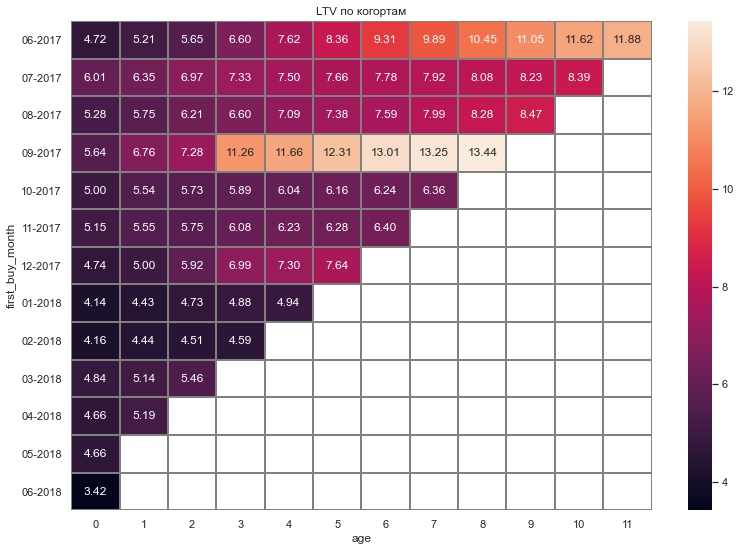

In [73]:
sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('LTV по когортам')
sns.heatmap(ltv_pivot.cumsum(axis=1), annot=True, fmt='.2f', linewidths=1, linecolor='gray',
        yticklabels=ltv_pivot.index.strftime('%m-%Y'));

Для того, чтобы сделать выводы из полученных данных, давайте найдем средний накопительный **LTV** за 6 месяц - более-менее серьезный период использования нашего сервиса. Так как еще не все когорты достигли данного возраста, примем в рассчет только те, которые нам подходят

In [74]:
print('Средняя прибыль с одного клиента за 6 месяцев: {:.2f} у.е.'.format(ltv_pivot.cumsum(axis=1)[6].mean(axis=0)))

Средняя прибыль с одного клиента за 6 месяцев: 8.39 у.е.


In [75]:
ltv_pivot.mean()[0]

4.801682381794593

Мы нашли средний доход с одного пользователя за 6 месяцев использования сервиса Афиши, он составил 8.39 у.е.

В данной сводной таблице также интересен один момент - высокая выручка пользователей сентябрьской когорты 17-го года в их третий месяц (в декабре того же года) - она значительно превосходит траты посетителей из других когорт в этот возраст

In [76]:
print('Средний доход за третий месяц по всем когортам: {:.2f} у.е./мес.\nСредний доход за третий месяц у когорты 09-2017: {:.2f} у.е./мес.'.format
      (
          ltv_pivot.mean()[3], ltv_pivot.loc['2017-09-01', 3]
      )
     )

Средний доход за третий месяц по всем когортам: 0.83 у.е./мес.
Средний доход за третий месяц у когорты 09-2017: 3.98 у.е./мес.


Для сравнения средний доход за нулевой месяц по всем когортам равен:

In [77]:
ltv_pivot.mean()[0]

4.801682381794593

Неплохо было бы установить причины этого явления, чтобы, в случае если это не ошибка, в дальнейшем применять при работе с клиентами

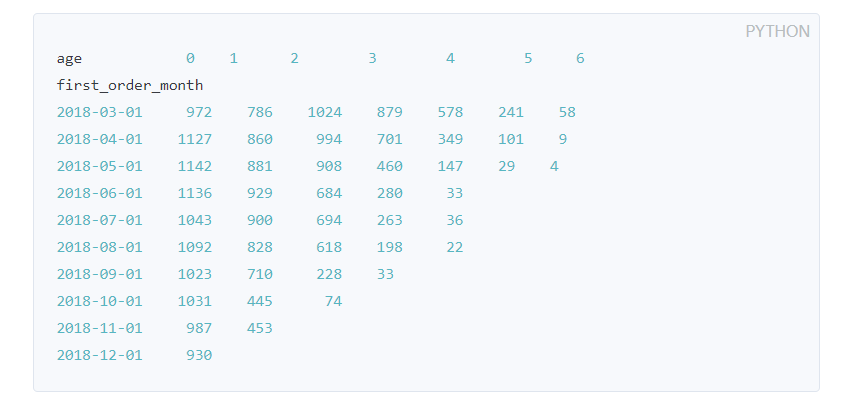

### Маркетинговые метрики

Здесь будем оценивать работу маркетинга нашей компании: рассмотрим распределение трат по источникам, а также рассчитаем основные маркетинговые метрики, такие как **CAC** и **ROMI**, по когортам в разрезе источников привлечения и выясним, какие из них можно считать перспективными, а какие - убыточными

#### Распределение трат по источникам

Узнаем, как распределены траты по источникам

In [78]:
costs['source_id'].value_counts()

5     364
2     363
4     363
10    363
1     363
3     363
9     363
Name: source_id, dtype: int64

Всего у нас есть 7 источников, почти по всем одинаковое количество маркетинговых кампаний. Найдем суммарные затраты по каждому из источников

In [79]:
costs_total = costs['costs'].sum()
costs_by_sources = costs.pivot_table(
    index='source_id',
    values='costs',
    aggfunc='sum'
)
display(costs_by_sources.describe())

,costs
count,7.00
mean,"47,018.80"
std,"46,967.96"
min,"5,517.49"
25%,"13,327.88"
50%,"42,806.04"
75%,"56,415.35"
max,"141,321.63"


Как мы видим, хоть количество кампаний у всех источников было примерно одинаковым, суммарные траты на разные источники могут значительно отличаться друг от друга

Визуализируем, как изменялись затраты на маркетинг с течением времени. Отразим изменения по месяцам

In [80]:
costs['cost_month'] = costs['dt'].astype('datetime64[M]')

costs_per_month = costs.groupby('cost_month').agg({'costs':'sum'}).reset_index()

fig = px.bar(
    costs_per_month, x='cost_month', y='costs',
    title='Расходы на маркетинг по месяцам'
)
fig.update_layout(yaxis_title = 'Расходы',
                  xaxis_title = '',
                  title = {'font':dict(size=22),
                           'x':0.5},
                  showlegend=False)

fig.update_traces(hovertemplate = 'Месяц: %{x}<br>Расходы: %{y}')
fig.show()

Как можно заметить, график распределения средств на маркетинг очень похож на график распределения пользовательской активности, что звучит логично: больше средств вкладываем в рекламу и продвижение продукта - больше пользователей привлекаем. Маркетологи со своей задачей справляются хорошо

#### Средний CAC

**CAC** *(или Customer Acquisition Cost)* - стоимость привлечения одного клиента. Найдем данный показатель по всему проекту и каждому источнику привлечения

In [81]:
costs['cost_month[M]'] = costs['dt'].astype('datetime64[M]')
costs.head()

,source_id,dt,costs,cost_month,cost_month[M]
0,1,2017-06-01,75.20,2017-06-01,2017-06-01
1,1,2017-06-02,62.25,2017-06-01,2017-06-01
2,1,2017-06-03,36.53,2017-06-01,2017-06-01
3,1,2017-06-04,55.00,2017-06-01,2017-06-01
4,1,2017-06-05,57.08,2017-06-01,2017-06-01


Так как один и тот же пользователь мог заходить на сайт из нескольких источников, определим главным источником (маркетинг по которому и привел клиента в наш сервис) первый источник перехода 

In [82]:
priority_sources = visits.sort_values('start_ts').groupby('uid')['source_id'].first()
orders_new = orders_new.merge(priority_sources, on='uid')
orders_new.head()

,buy_ts,revenue,uid,buy_month[M],first_buy_month,source_id
0,2017-06-01 00:10:00,17.00,10329302124590727494,2017-06-01,2017-06-01,1
1,2017-06-01 00:25:00,0.55,11627257723692907447,2017-06-01,2017-06-01,2
2,2017-06-01 00:27:00,0.37,17903680561304213844,2017-06-01,2017-06-01,2
3,2017-06-01 00:29:00,0.55,16109239769442553005,2017-06-01,2017-06-01,2
4,2017-06-01 07:58:00,0.37,14200605875248379450,2017-06-01,2017-06-01,3


Найдем количество пользователей в каждой когорте, привлеченных по разным источникам

In [83]:
n_users_by_sources_per_months = orders_new.groupby(['first_buy_month', 'source_id']).agg({'uid':'nunique'}).rename(columns={'uid':'n_users'}).reset_index()
n_users_by_sources_per_months.head()

,first_buy_month,source_id,n_users
0,2017-06-01,1,190
1,2017-06-01,2,235
2,2017-06-01,3,638
3,2017-06-01,4,413
4,2017-06-01,5,384


Теперь найдем затраты на привлечение одного пользователя и также разделим пользователей по источникам их привлечения

In [84]:
costs_by_sources_per_months = costs.groupby(['cost_month[M]', 'source_id']).agg({'costs':'sum'}).reset_index()
costs_by_sources_per_months.head()

,cost_month[M],source_id,costs
0,2017-06-01,1,"1,125.61"
1,2017-06-01,2,"2,427.38"
2,2017-06-01,3,"7,731.65"
3,2017-06-01,4,"3,514.80"
4,2017-06-01,5,"2,616.12"


Объединим таблицы с размерами когорт и информацией о затратах

In [85]:
cac_by_sources_per_months = (
    n_users_by_sources_per_months.merge(
        costs_by_sources_per_months,
        left_on=['first_buy_month', 'source_id'],
        right_on=['cost_month[M]', 'source_id']
    )
)
cac_by_sources_per_months.head()

,first_buy_month,source_id,n_users,cost_month[M],costs
0,2017-06-01,1,190,2017-06-01,"1,125.61"
1,2017-06-01,2,235,2017-06-01,"2,427.38"
2,2017-06-01,3,638,2017-06-01,"7,731.65"
3,2017-06-01,4,413,2017-06-01,"3,514.80"
4,2017-06-01,5,384,2017-06-01,"2,616.12"


Приведем таблицу к человеческому виду: удалим столбцы с дублирующимися значениями

In [86]:
del cac_by_sources_per_months['cost_month[M]']
cac_by_sources_per_months.head()

,first_buy_month,source_id,n_users,costs
0,2017-06-01,1,190,"1,125.61"
1,2017-06-01,2,235,"2,427.38"
2,2017-06-01,3,638,"7,731.65"
3,2017-06-01,4,413,"3,514.80"
4,2017-06-01,5,384,"2,616.12"


Найдем показатель **CAC**. Для этого разделим затраты на количество пользователей

In [87]:
cac_by_sources_per_months['cac'] = cac_by_sources_per_months['costs'] / cac_by_sources_per_months['n_users']
cac_by_sources_per_months.head()

,first_buy_month,source_id,n_users,costs,cac
0,2017-06-01,1,190,"1,125.61",5.92
1,2017-06-01,2,235,"2,427.38",10.33
2,2017-06-01,3,638,"7,731.65",12.12
3,2017-06-01,4,413,"3,514.80",8.51
4,2017-06-01,5,384,"2,616.12",6.81


Отобразим изменения на затраты на привлечение клиента во времени с учетом источника привлечения

In [88]:
fig = px.line(
    cac_by_sources_per_months, x='first_buy_month', y='cac', color='source_id',
    title='Среднемесячный расход с источника привлечения на одного пользователя'
)
fig.update_layout(yaxis_title = 'Среднемесячный расход на одного пользователя',
                  xaxis_title = '',
                  title = {'font':dict(size=22),
                           'x':0.5},
                  showlegend=True)

fig.update_traces(hovertemplate = 'Месяц: %{x}<br>Средний расход: %{y:.2f}')
fig.show()

По графику понятно, что источники 2 и 3 - самый дорогие с точки зрения привлечения новых пользователей, а остальные - более выгодные. Чтобы выяснить, кто насколько выгоден в общем, найдем средний расход на одного клиента не по месяцам, а за все время проекта. Для этого сгруппируем данные по источникам привлечения и найдем суммарные затраты и суммарное количество пользователей

In [89]:
cac_by_sources = cac_by_sources_per_months.groupby('source_id').agg({'n_users':'sum', 'costs':'sum'}).reset_index()
cac_by_sources

,source_id,n_users,costs
0,1,2899,"20,833.27"
1,2,3506,"42,806.04"
2,3,10473,"141,321.63"
3,4,10295,"61,073.60"
4,5,6931,"51,757.10"
5,9,1088,"5,517.49"
6,10,1329,"5,822.49"


Разделим одно на другое, тем самым получим стоимость привлечения за все время проекта

In [90]:
cac_by_sources['cac'] = cac_by_sources['costs'] / cac_by_sources['n_users']
cac_by_sources.sort_values('cac')

,source_id,n_users,costs,cac
6,10,1329,"5,822.49",4.38
5,9,1088,"5,517.49",5.07
3,4,10295,"61,073.60",5.93
0,1,2899,"20,833.27",7.19
4,5,6931,"51,757.10",7.47
1,2,3506,"42,806.04",12.21
2,3,10473,"141,321.63",13.49


Построим график, где также разделим разными цветами значения, относящиеся к разным источникам

In [91]:
fig = px.bar(
    cac_by_sources, x='source_id', y='cac', color='source_id',
    title='Средний расход с источника привлечения на одного пользователя за весь проект'
)
fig.update_layout(yaxis_title = 'Средний расход на одного пользователя',
                  xaxis_title = '',
                  title = {'font':dict(size=22),
                           'x':0.5},
                  showlegend=True)

fig.update_traces(hovertemplate = 'Источник: %{x}<br>Средний расход: %{y:.2f}')
fig.show()

Самым выгодным источником с точки зрения стоимости привлечения одного клиента по всему проекту оказался десятый. Средний расход по этому источнику составил 4.38 у.е. Самым невыгодным, как и в разрезе месяцев, оказался третий. Стоимость привлечения одного клиента через данный источник более чем в 3 раза больше, чем у девятого (13.49 у.е.)

#### ROMI по когортам в разрезе источников

**ROMI** *(или Return on Marketing Investment)* - это рентабельность инвестиций в маркетинг, или то, насколько маркетинг себя окупает. Для того, чтобы рассчитать данный показатель, нужно средний доход с одного пользователя разделить на среднюю стоимость привлечения одного пользователя *(LTV на CAC)*

У нас уже посчитан *CAC* по источникам в месяц, поэтому будем искать *LTV* по когортам и источникам. Для начала найдем общую выручку, разбитую по когортам и источникам привлечения

In [92]:
ltv_by_sources = orders_new.groupby(['first_buy_month', 'buy_month[M]', 'source_id']).agg({'revenue':'sum'}).reset_index()
ltv_by_sources.head()

,first_buy_month,buy_month[M],source_id,revenue
0,2017-06-01,2017-06-01,1,"1,378.70"
1,2017-06-01,2017-06-01,2,"1,043.68"
2,2017-06-01,2017-06-01,3,"2,804.34"
3,2017-06-01,2017-06-01,4,"1,959.84"
4,2017-06-01,2017-06-01,5,"1,898.89"


Теперь добавим в эту таблицу размеры когорт, найденных в предыдущем пункте

In [93]:
ltv_by_sources = n_users_by_sources_per_months.merge(ltv_by_sources, on=['first_buy_month', 'source_id'])
ltv_by_sources.head()

,first_buy_month,source_id,n_users,buy_month[M],revenue
0,2017-06-01,1,190,2017-06-01,"1,378.70"
1,2017-06-01,1,190,2017-07-01,414.98
2,2017-06-01,1,190,2017-08-01,419.43
3,2017-06-01,1,190,2017-09-01,714.24
4,2017-06-01,1,190,2017-10-01,811.20


Посчитаем возраст когорт в каждый последующий месяц их активности

In [94]:
ltv_by_sources['age'] = (
    (
        ltv_by_sources['buy_month[M]'] - ltv_by_sources['first_buy_month']
    ) / np.timedelta64(1, 'M')
).round().astype(int)
ltv_by_sources.head()

,first_buy_month,source_id,n_users,buy_month[M],revenue,age
0,2017-06-01,1,190,2017-06-01,"1,378.70",0
1,2017-06-01,1,190,2017-07-01,414.98,1
2,2017-06-01,1,190,2017-08-01,419.43,2
3,2017-06-01,1,190,2017-09-01,714.24,3
4,2017-06-01,1,190,2017-10-01,811.20,4


И найдем **LTV** ровно также, как в ранее в исследовании

In [95]:
ltv_by_sources['gp'] = ltv_by_sources['revenue'] * margin_rate
ltv_by_sources['ltv'] = ltv_by_sources['gp'] / ltv_by_sources['n_users']
ltv_by_sources.head()

,first_buy_month,source_id,n_users,buy_month[M],revenue,age,gp,ltv
0,2017-06-01,1,190,2017-06-01,"1,378.70",0,"1,378.70",7.26
1,2017-06-01,1,190,2017-07-01,414.98,1,414.98,2.18
2,2017-06-01,1,190,2017-08-01,419.43,2,419.43,2.21
3,2017-06-01,1,190,2017-09-01,714.24,3,714.24,3.76
4,2017-06-01,1,190,2017-10-01,811.20,4,811.20,4.27


Теперь найдем **ROMI**. Для этого соединим таблицы *ltv_by_sources* и *cac_by_sources_per_months*

In [96]:
romi_by_sources = ltv_by_sources.merge(cac_by_sources_per_months, on=['first_buy_month', 'source_id'])
romi_by_sources.head()

,first_buy_month,source_id,n_users_x,buy_month[M],revenue,age,gp,ltv,n_users_y,costs,cac
0,2017-06-01,1,190,2017-06-01,"1,378.70",0,"1,378.70",7.26,190,"1,125.61",5.92
1,2017-06-01,1,190,2017-07-01,414.98,1,414.98,2.18,190,"1,125.61",5.92
2,2017-06-01,1,190,2017-08-01,419.43,2,419.43,2.21,190,"1,125.61",5.92
3,2017-06-01,1,190,2017-09-01,714.24,3,714.24,3.76,190,"1,125.61",5.92
4,2017-06-01,1,190,2017-10-01,811.20,4,811.20,4.27,190,"1,125.61",5.92


Удалим повторяющиеся столбцы, приведем таблицу к красивому виду

In [97]:
del romi_by_sources['n_users_y']
romi_by_sources.rename(columns={'n_users_x':'n_users'}, inplace=True)
romi_by_sources.head()

,first_buy_month,source_id,n_users,buy_month[M],revenue,age,gp,ltv,costs,cac
0,2017-06-01,1,190,2017-06-01,"1,378.70",0,"1,378.70",7.26,"1,125.61",5.92
1,2017-06-01,1,190,2017-07-01,414.98,1,414.98,2.18,"1,125.61",5.92
2,2017-06-01,1,190,2017-08-01,419.43,2,419.43,2.21,"1,125.61",5.92
3,2017-06-01,1,190,2017-09-01,714.24,3,714.24,3.76,"1,125.61",5.92
4,2017-06-01,1,190,2017-10-01,811.20,4,811.20,4.27,"1,125.61",5.92


И посчитаем **ROMI** по формуле: **ROMI = LTV / CAC**

In [98]:
romi_by_sources['romi'] = romi_by_sources['ltv'] / romi_by_sources['cac']
romi_by_sources.head()

,first_buy_month,source_id,n_users,buy_month[M],revenue,age,gp,ltv,costs,cac,romi
0,2017-06-01,1,190,2017-06-01,"1,378.70",0,"1,378.70",7.26,"1,125.61",5.92,1.22
1,2017-06-01,1,190,2017-07-01,414.98,1,414.98,2.18,"1,125.61",5.92,0.37
2,2017-06-01,1,190,2017-08-01,419.43,2,419.43,2.21,"1,125.61",5.92,0.37
3,2017-06-01,1,190,2017-09-01,714.24,3,714.24,3.76,"1,125.61",5.92,0.63
4,2017-06-01,1,190,2017-10-01,811.20,4,811.20,4.27,"1,125.61",5.92,0.72


Теперь для каждого источника построим тепловую карту с накопительным **ROMI**. Она покажет, за какой период и во сколько раз маркетинг окупается прибылью (значения больше единицы) или не окупает (значения меньше единицы)

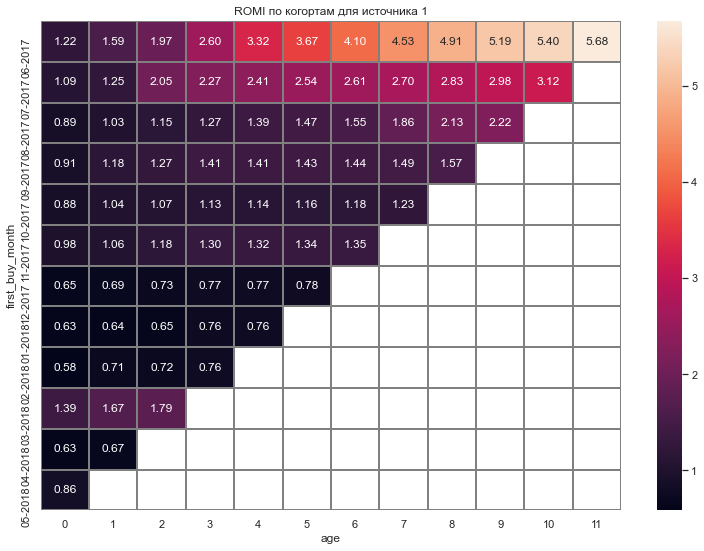

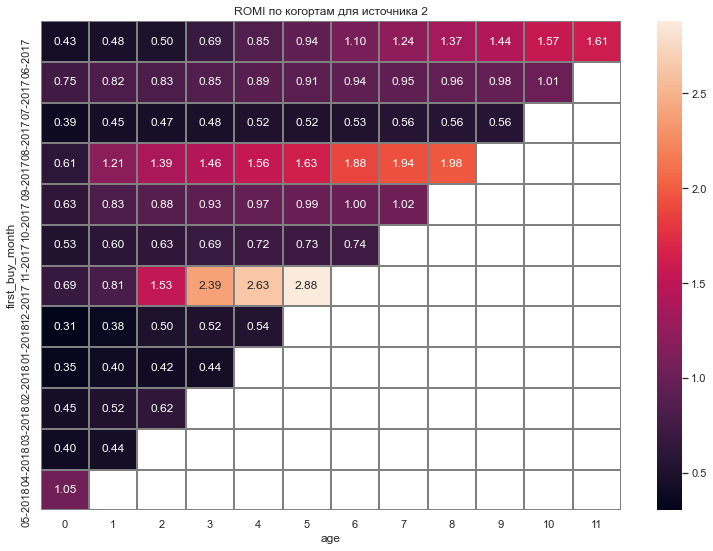

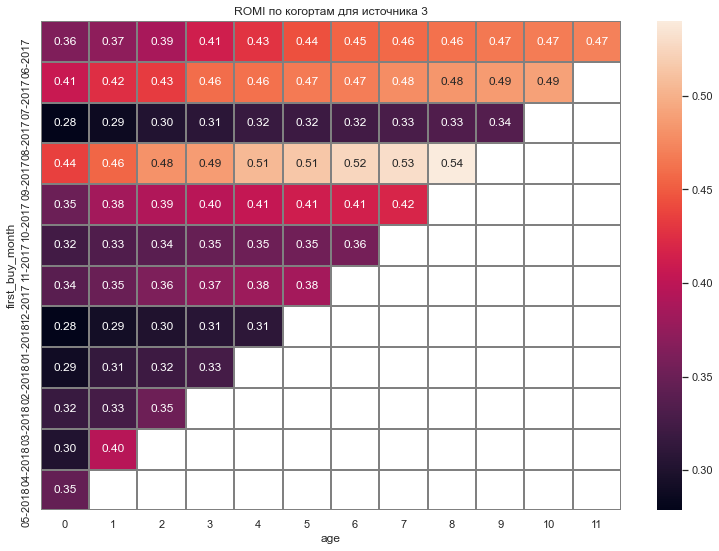

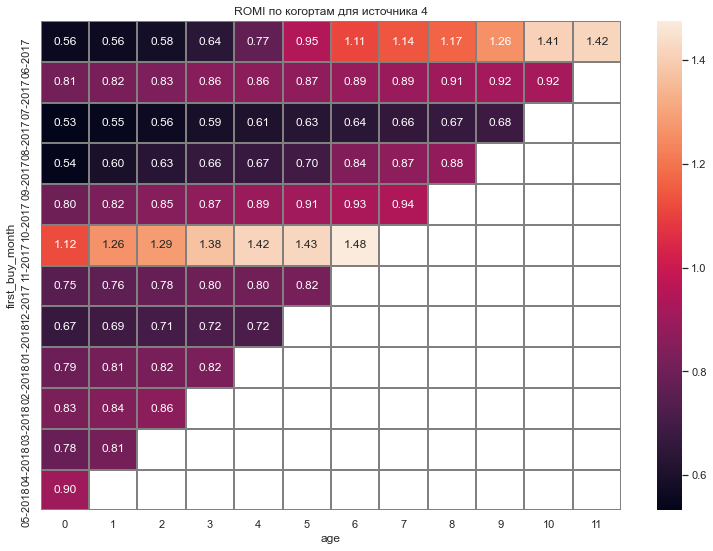

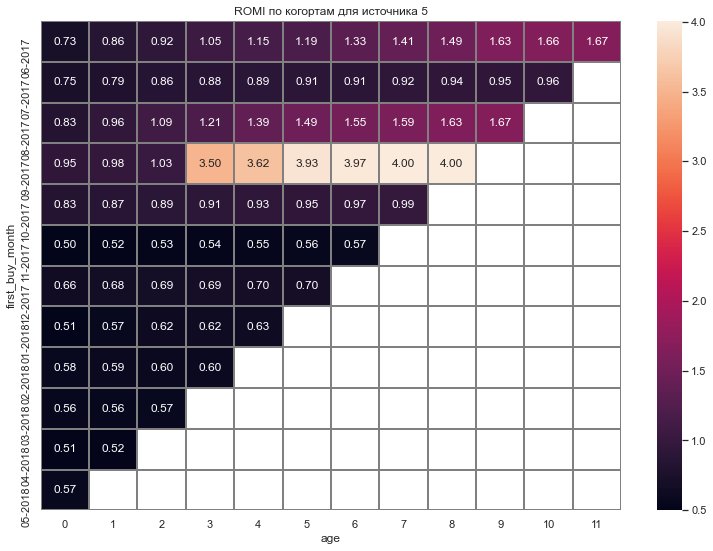

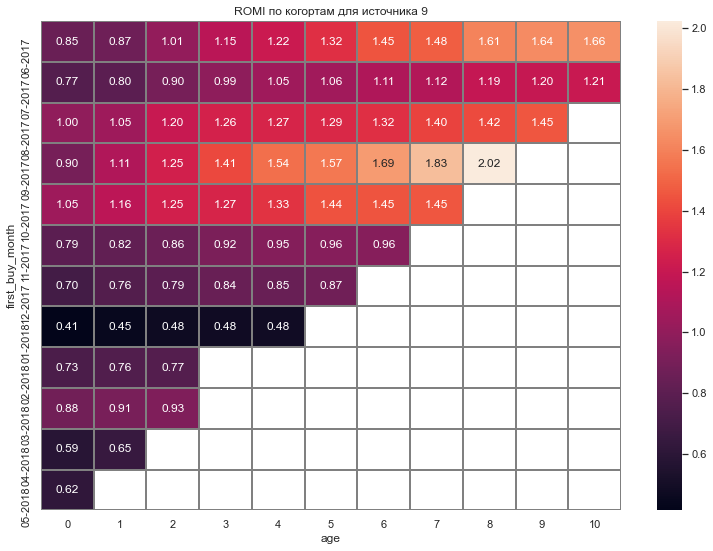

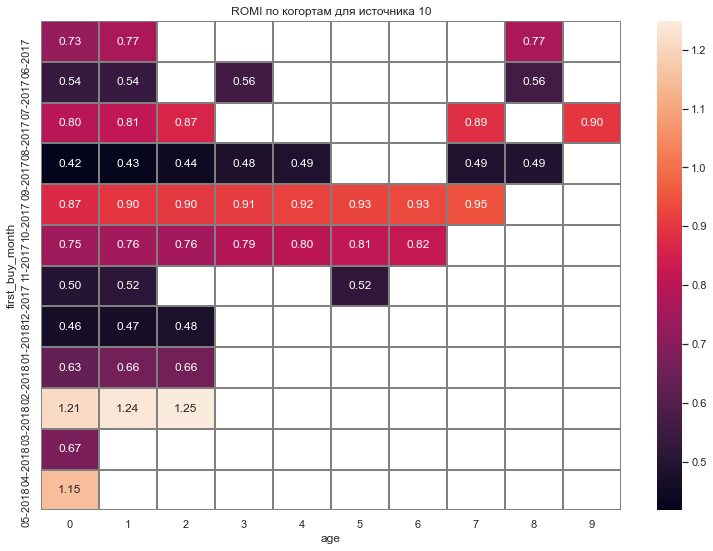

In [99]:
sources = romi_by_sources['source_id'].unique()
for source in sources:
    romi_pivot = (
        romi_by_sources
        .query('source_id == @source')
        .pivot_table(
            index='first_buy_month',
            columns='age',
            values='romi',
            aggfunc='mean'
        )
    )
    
    sns.set(style='white')
    plt.figure(figsize=(13, 9))
    plt.title('ROMI по когортам для источника {}'.format(source))
    sns.heatmap(
        romi_pivot.cumsum(axis=1),
        annot=True,
        fmt='.2f',
        linewidths=1,
        linecolor='gray',
        yticklabels=romi_pivot.index.strftime('%m-%Y')
    );

Выводы по данной серии графиков нужно делать следующим образом: чем выше значение *ROMI*, тем лучше для бизнеса. Очевидно, что первый источник - лучший в плане окупаемости: как по скорости, так и по абсолютным показателям. Также очевидно, что третий источник еще ни в одной когорте даже не приблизился к тому, чтобы окупиться, соответственно можно считать его неудачным, и либо пересмотреть кампанию, либо вовсе не тратить ресурсы на данный источник.

Рассмотрим источники подробнее, чтобы оценить рентабельность маркетинга по остальным источникам, а также подтвердить (или опровергнуть) выводы по первому и третьему:

In [100]:
for source in sources:
    romi_pivot = (
        romi_by_sources
        .query('source_id == @source')
        .pivot_table(
            index='first_buy_month',
            columns='age',
            values='romi',
            aggfunc='mean'
        )
    )
    print('Распределение среднего ROMI относительно возраста когорты для источника {}:\n{}\n'.
          format(source, romi_pivot.cumsum(axis=1).mean(axis=0).describe())
         )

Распределение среднего ROMI относительно возраста когорты для источника 1:
count   12.00
mean     2.38
std      1.45
min      0.89
25%      1.34
50%      1.90
75%      3.01
max      5.68
dtype: float64

Распределение среднего ROMI относительно возраста когорты для источника 2:
count   12.00
mean     1.04
std      0.30
min      0.55
25%      0.90
50%      1.06
75%      1.22
max      1.61
dtype: float64

Распределение среднего ROMI относительно возраста когорты для источника 3:
count   12.00
mean     0.41
std      0.05
min      0.34
25%      0.38
50%      0.42
75%      0.45
max      0.48
dtype: float64

Распределение среднего ROMI относительно возраста когорты для источника 4:
count   12.00
mean     0.93
std      0.19
min      0.76
25%      0.81
50%      0.90
75%      0.96
max      1.42
dtype: float64

Распределение среднего ROMI относительно возраста когорты для источника 5:
count   12.00
mean     1.30
std      0.43
min      0.66
25%      1.03
50%      1.35
75%      1.58
max      2.02
d

На основании этих данных уже можно четко разделить источники: на окупаемые и неокупаемые. **Окупаемые:** *первый(средняя окупаемость: 2.38 - во столько раз прибыль с клиентов, перешедших по данному источнику, превысили затраты на их привлечение), второй(1.04), пятый(1.3) и девятый(1.19)*. **Неокупаемые:** *третий(0.41), четвертый(0.93) и десятый(0.75)*

Также рассмотрим на окупаемость исключительно когорты

In [101]:
romi_cohorts = romi_by_sources.groupby(['first_buy_month', 'age']).agg({'n_users':'sum', 'revenue':'sum', 'costs':'sum'}).reset_index()
romi_cohorts.head()

,first_buy_month,age,n_users,revenue,costs
0,2017-06-01,0,2023,"9,557.49","18,015.00"
1,2017-06-01,1,2023,981.82,"18,015.00"
2,2017-06-01,2,1928,885.34,"17,700.78"
3,2017-06-01,3,1928,"1,931.30","17,700.78"
4,2017-06-01,4,1928,"2,068.58","17,700.78"


Произведем необходимые вычисления и найдем **ROMI**

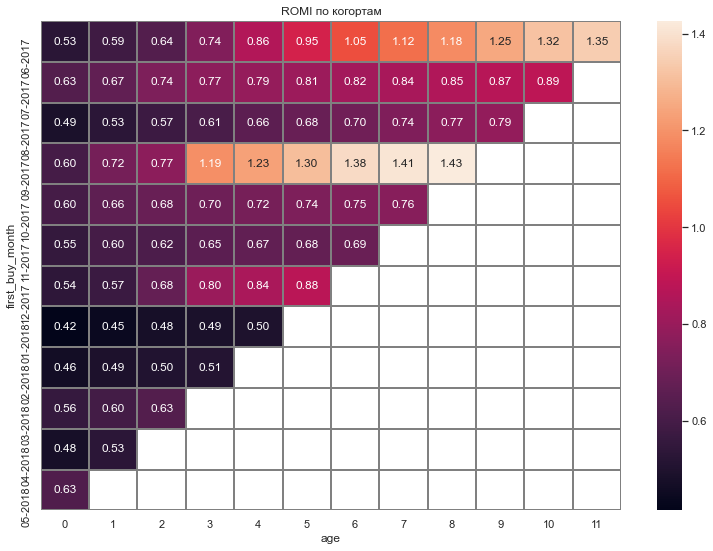

In [102]:
romi_cohorts['gp'] = romi_cohorts['revenue'] * margin_rate
romi_cohorts['ltv'] = romi_cohorts['gp'] / romi_cohorts['n_users']
romi_cohorts['cac'] = romi_cohorts['costs'] / romi_cohorts['n_users']
romi_cohorts['romi'] = romi_cohorts['ltv'] / romi_cohorts['cac']
romi_pivot = romi_cohorts.pivot_table(
    index='first_buy_month',
    columns='age',
    values='romi',
    aggfunc='mean'
)

sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('ROMI по когортам')
sns.heatmap(romi_pivot.cumsum(axis=1), annot=True, fmt='.2f', linewidths=1, linecolor='gray',
        yticklabels=romi_pivot.index.strftime('%m-%Y'));

Как мы видим, единственные окупившие траты на себя когорты - 06-2017 и 09-2017, остальные пока еще не окупили те затраты маркетинга, благодаря которому были привлечены

## Общий вывод

### Источники

Самыми удачными источниками с точки зрения привлечения клиентов являются первый, второй, пятый и девятый. Лучшие из них: первый и пятый. Средняя окупаемость у данных источников за все время исследования составила 2.38 и 1.3, соответственно. У второго и девятого этот показатель составил 1.04 и 1.19.
<br><br>Первый источник - несомненно **лучший вариант** для вложения дополнительных средств - пользователи семи из одиннадцати когорт, привлеченные с помощью данного источника, уже окупили своими покупками деньги на их привлечение, причем сделали это уже **на второй месяц** после первой покупки. Также у пользователей, привлеченных с помощью данного источника, зафиксирована самая высокий показатель суммарной окупаемости за весь период проекта - **5.68** - у пользователей первой когорты(06-2017).
<br><br>Худший источник с точки зрение окупаемости - третий. Ни одна из когорт, привлеченных через этот источник, до сих пор **так и не окупила затраты на их привлечение**. Средняя окупаемость данного источника равна **0.41**, то есть на одну единицу, вложенную в привлечение клиентов, мы теряем 0.59.
<br><br>Остальные источники либо также оказались убыточными, однако стоит отметить, что окупаемость источника 10 в у последних привлеченных когорт стала заметно выше, чем раньше, и в двух из трех случаев затраты окупились уже в первый месяц

### Метрики

**DAU, WAU, MAU**
<br>Среднее количество посещений в месяц за первый и четвертый кварталы оказалось почти в 2 раза больше, чем за второй и третий кварталы, что, скорее всего, говорит нам о том, что интерес к культурным мероприятиям повышается в периоды праздников и уменьшается в периоды дачного сезона и отпусков
<br><br>**Retention rate**
<br>Средний *retention* **ко второму месяцу равен 5%**, что не так уж и много, однако стоит учитывать специфику нашего продукта. Это не сервис на каждый день, так как необходимость использовать сервис появляется, когда появляются интересные мероприятия. С нашей стороны  должно быть сделано все, чтобы пользователь не упустил интересные для него события: присылать пользователю афишу мероприятий на основе его вкусов
<br><br>**Средний продолжительность сессии, среднее время до покупки**
<br>Самое популярное время, которое пользователь проводит в сервисе Яндекс.Афиши, - **1-2 минуты**, точно столько же требуется времени в самом частом случае, чтобы совершить покупку
<br><br>**Средний чек**
<br>Среднемесячный чек принимает значения **от 4.75 до 5.35 у.е**.
<br><br>**LTV**
<br>Средний накопительный *LTV* **за 6 месяцев равен 8.39 у.е**. Самый большой средний *LTV* по когортам, естественно, у нулевого месяца(), однако у когорты **09-2017 за третий месяц** данный показатель сравним с ними(**3.98**). Интересно было бы выяснить подробности: что повлияло на такую активность данной когорты в тот месяц
<br><br>**CAC**
<br>Дороже всех обходится третий источник (**15.47 у.е.** на одного привлеченного клиента), наименьшее у девятого (**3.90 у.е.**)

### Когорты

Единственные когорты, на которых уже удалось заработать больше, чем потратить, - **06-2017** (окупилась к шестому месяцу) и **09-2017** (к третьему). Остальные когорты пока отстают в этом плане. Возможно стоит придумать акцию для старичков или вновь прибывших клиентов, чтобы они могли догнать самые успешные когорты